# Consume, analyze and visualize real-time data from IBM Message Hub
[Citi Bike](https://www.citibikenyc.com/) is the largest bike share program in New York City with around 10,000 bikes and 600 stations across Manhatten, Brookyn, Queens and Jersey City. The platform publishes real-time system data in [General Bikeshare Feed Specification (GBFS)](https://github.com/NABSA/gbfs/blob/master/gbfs.md) format. [Get the GBFS feed here.](https://gbfs.citibikenyc.com/gbfs/gbfs.json)  

In this tutorial, we will use [IBM Data Science Experience](https://datascience.ibm.com/) to analyze and extract insights from this real-time system data of Citi Bike. For the prupose, we use technologies like [Jupyter Notebooks](http://jupyter.org/), [IBM Message Hub](http://www-03.ibm.com/software/products/en/ibm-message-hub) and [PixieDust](https://github.com/ibm-watson-data-lab/pixiedust). The objective of the tutorial is to demonstrate, the process of producing and consuming real-time data with IBM Message Hub as well as the analysis and visualization of real-time system data with IBM Data Science Experience.

When the reader has completed this tutorial, they will understand how to:

* Create and configure the IBM Message Hub services on Bluemix.
* Produce real-time system data into IBM Message Hub service.
* Consume real-time system data from IBM Message Hub service.
* Transform and analyze real-time system data with Jupyter notebooks in IBM Data Science Experience.
* Visualization of real-time system data with Python libaries like PixieDust, Matplotlib and Mplleaflet.

<!--<p><img align="right" src="http://www.brandchannel.com/wp-content/uploads/2015/04/citi_bike_app_600.jpg" width="450"/></p>-->
<p><img align="right" src="https://github.com/danielLinke/citibike-analysis/blob/master/doc/source/images/logo_citibike.png?raw=true" width="450"/></p>

## Included Components
* Jupyter notebook with Python
* IBM Message Hub from Bluemix
* Pandas (Python data analysis library)
* Matplotlib (Python 2D plotting library)
* PixieDust (Python helper library)
* Mplleaflet (Python library for geo visualization)

## Contents
This notebook contains the following parts:

1.	[IBM Message Hub service](#messagehub)
2.  [Produce real-time data into IBM Message Hub](#produce)
2.	[Consume real-time data from IBM Message Hub](#consume)
3.	[Explore, transform and analyze real-time data with IBM Data Science Experience](#analyze)
4.  [Visualization of real-time system data](#visualize)
5.	[Summary and next steps](#summary)

<a id="messagehub"></a>
# 1 IBM Message Hub service 
IBM Message Hub is a cloud service from Bluemix and based on Apache Kafka: a fast, scalable, and durable real-time messaging engine from the Apache Software Foundation. 
To understand the benefits of using Apache Kafka as a service, see [Message Hub: Apache Kafka as a Service](https://developer.ibm.com/messaging/2016/03/14/message-hub-apache-kafka-as-a-service/).

### Sign up for the Data Science Experience
If you don't have an account for Data Science Experience, yet. Please, sign up for [IBM's Data Science Experience](https://datascience.ibm.com/). The IBM Data Science Experience is free for a 30-day trial period.

### Create an IBM Message Hub service
Now you’re ready to start laying down infrastucture for live-streaming. Start by creating a Message Hub instance. You can create your IBM Message Hub instance [here](https://apsportal.ibm.com/data/discovery/message-hub/details?target=services&context=analytics) or following the instruction below.

1. Go into your IBM Data Science Experience account
2. In Data Science Experience, on top menu, click __`Data Services`__ and afterwards __`Services`__. 
3. You can create an IBM Message Hub instance under the button __`Create new`__ and select __`Message Hub`__.
4. Click __`Buy Message Hub`__ for creating a new Message Hub instance
5. Use the default settings, insert your service name (for example: __`message-hub`__) and confirm your settings   
    
Now, you have created an IBM Message Hub instance successfully in Bluemix. You can also using an exisiting Message Hub instance from Bluemix or create a Message Hub instance directly in Bluemix.     

### Get your Service credentials from IBM Message Hub service
In this step, you will insert your service credentials from the IBM Message Hub instance into your notebook.

1. Go into your IBM data Science Experience Notebook
2. <img style="float: left;" src="https://github.com/danielLinke/citibike-analysis/blob/master/doc/source/images/btn_add.png?raw=true" width="16"/>  &rarr; Insert a cell below with this button and go into the cell 

3. <img style="float: left;" src="https://github.com/danielLinke/citibike-analysis/blob/master/doc/source/images/btn_io.png?raw=true" width="16"/>  &rarr; Click this Button on top menu
4. In the side bar on the right side, Click __`Connections`__
5. You will see the service_name of your Message Hub instances. Click for your Service Hub instances __`insert to code`__.
6. The new generated code should look like in the example below and contains the parameters __`api_key`__,__`kafka_admin_url`__, __`kafka_broker_sasl`__, __`user`__ and __`password`__. The URLs may differ depending on your Bluemix region. 

```json
credentials_1 = {
  'instance_id':'fa0e5d69-995a-4281-ab1e-48fd017742c8',
  'mqlight_lookup_url':'https://mqlight-lookup-prod01.messagehub.services.us-south.bluemix.net/Lookup?serviceId=fa0e5d69-995a-4281-ab1e-48fd017742c8',
  'api_key':'<your_api_key>',
  'kafka_admin_url':'https://kafka-admin-prod01.messagehub.services.us-south.bluemix.net:443',
  'kafka_rest_url':'https://kafka-rest-prod01.messagehub.services.us-south.bluemix.net:443',
  'kafka_brokers_sasl':'kafka01-prod01.messagehub.services.us-south.bluemix.net:9093,kafka04-prod01.messagehub.services.us-south.bluemix.net:9093,kafka03-prod01.messagehub.services.us-south.bluemix.net:9093,kafka05-prod01.messagehub.services.us-south.bluemix.net:9093,kafka02-prod01.messagehub.services.us-south.bluemix.net:9093',
  'user':'<your_user>',
  'password':'<your_password>',
  'topic':'citibike'
}
``` 

In [2]:
# @hidden_cell
credentials_1 = {
  'instance_id':'fa0e5d69-995a-4281-ab1e-48fd017742c8',
  'mqlight_lookup_url':'https://mqlight-lookup-prod01.messagehub.services.us-south.bluemix.net/Lookup?serviceId=fa0e5d69-995a-4281-ab1e-48fd017742c8',
  'api_key':'sRocZXdHifVXWfD2cmXHK28qadxr1KJ1rJZgd8HTe5dQMqlb',
  'kafka_admin_url':'https://kafka-admin-prod01.messagehub.services.us-south.bluemix.net:443',
  'kafka_rest_url':'https://kafka-rest-prod01.messagehub.services.us-south.bluemix.net:443',
  'kafka_brokers_sasl':'kafka01-prod01.messagehub.services.us-south.bluemix.net:9093,kafka04-prod01.messagehub.services.us-south.bluemix.net:9093,kafka03-prod01.messagehub.services.us-south.bluemix.net:9093,kafka05-prod01.messagehub.services.us-south.bluemix.net:9093,kafka02-prod01.messagehub.services.us-south.bluemix.net:9093',
  'user':'sRocZXdHifVXWfD2',
  'password':"""cmXHK28qadxr1KJ1rJZgd8HTe5dQMqlb""",
  'topic':'citibike'
}

<a id="produce"></a>
# 2 Produce real-time data into IBM Message Hub

In the next step, we will use an application to produce a real-time data stream into the IBM Message Hub service. The producer application is written in Java. In the scenario, the application read real-time system data from the [Citi bike feed](https://gbfs.citibikenyc.com/gbfs/gbfs.json) and send this datastream to the topic __`citibike`__ into IBM's Message Hub service. For a deeper insight of the producer application. You can find source code and more in the Message Hub samples [here](https://github.com/danielLinke/message-hub-samples).

### Running the producer sample
Please, download the zip file __[kafka producer](https://ibm.ent.box.com/s/wozmp56jeewiaqlr4korl8pone03ihpe)__. Save and unzip the file on your local device. Afterwards, go and change to the directory of the file __`kafka-producer.jar`__ and execute the following command in your console:

```bash
java -cp kafka-producer.jar <kafka_brokers_sasl> <kafka_admin_url> <api_key> -topic "citibike" -producer -json "https://gbfs.citibikenyc.com/gbfs/en/station_information.json"
```

To find the values for __`<kafka_brokers_sasl>`__, __`<kafka_admin_url>`__ and __`<api_key>`__, access your Message Hub instance in Bluemix, go to the __`Service Credentials`__ tab and use your indivdiual __`Credentials`__.

__Note:__ __`<kafka_brokers_sasl>`__ must be a single string enclosed in quotes. For example: __`"host1:port1,host2:port2"`__. We recommend using all the Kafka hosts listed in the __`Credentials`__ you selected.

You run only the producer by respectively adding __`-producer`__ to the command above. Also, we specify the Kafka topic to use by adding the argument __`-topic "citibike"`__ and the JSON source file with __`-json "https://gbfs.citibikenyc.com/gbfs/en/station_information.json"`__.

The sample will run indefinitely until interrupted. To stop the process, use __`Ctrl + C`__, for example. Below is a snippet of the output generated by the sample, if the applciation works fine.

```bash
...
[2017-07-05 15:36:01,496] INFO Creating the topic citibike (com.messagehub.samples.MessageHubConsoleSample)
[2017-07-05 15:36:04,044] INFO Admin REST Listing Topics: [{"name":"citibike","partitions":1,"retentionMs":"86400000","markedForDeletion":false}] (com.messagehub.samples.MessageHubConsoleSample)
[2017-07-05 15:36:05,314] INFO [Partition(topic = citibike, partition = 0, leader = 6, replicas = [5,6,7], isr = [6,5,7])] (com.messagehub.samples.ProducerRunnable)
[2017-07-05 15:36:05,315] INFO MessageHubConsoleSample will run until interrupted. (com.messagehub.samples.MessageHubConsoleSample)
[2017-07-05 15:36:05,317] INFO class com.messagehub.samples.ProducerRunnable is starting. (com.messagehub.samples.ProducerRunnable)
[2017-07-05 15:36:09,034] INFO Message produced, offset: 16740 (com.messagehub.samples.ProducerRunnable)
[2017-07-05 15:36:11,934] INFO Message produced, offset: 16741 (com.messagehub.samples.ProducerRunnable)
[2017-07-05 15:36:15,176] INFO Message produced, offset: 16742 (com.messagehub.samples.ProducerRunnable)
[2017-07-05 15:36:17,586] INFO Message produced, offset: 16743 (com.messagehub.samples.ProducerRunnable)
[2017-07-05 15:36:19,964] INFO Message produced, offset: 16744 (com.messagehub.samples.ProducerRunnable)
[2017-07-05 15:36:22,955] INFO Message produced, offset: 16745 (com.messagehub.samples.ProducerRunnable)
[2017-07-05 15:36:25,790] INFO Message produced, offset: 16746 (com.messagehub.samples.ProducerRunnable)
[2017-07-05 15:36:28,167] INFO Message produced, offset: 16747 (com.messagehub.samples.ProducerRunnable)
[2017-07-05 15:36:30,567] INFO Message produced, offset: 16748 (com.messagehub.samples.ProducerRunnable)
...
```

<a id="consume"></a>
# 3 Consume real-time data from IBM Message Hub
In this section you will load the data as an PandasData Frame. The static data from Citi Bike like station information and system regions will loaded by using the HTTP library __`requests`__ for Python. For consuming the real-time system data from the IBM Message Hub service, you will use the __`KafkaConsumer`__, a Kafka client that consumes records from a Kafka cluster like IBM Message Hub.

## Preparation - Install Libraries
Before you use the sample code in this notebook, you must install the libararies __`kafka-python`__, __`pixiedust`__ and __`mplleaflet`__ to your notebook. You can install the libraries via the package management system __pip__. 

In [3]:
#Install libraries
!pip install --user kafka-python
!pip install --user mplleaflet
!pip install --user geojson
!pip install --user IPython
!pip install --user --upgrade pixiedust

Requirement already up-to-date: pixiedust in /gpfs/global_fs01/sym_shared/YPProdSpark/user/s202-77e3daac89c518-3e8eb61d533b/.local/lib/python3.5/site-packages
Requirement already up-to-date: lxml in /gpfs/global_fs01/sym_shared/YPProdSpark/user/s202-77e3daac89c518-3e8eb61d533b/.local/lib/python3.5/site-packages (from pixiedust)
Requirement already up-to-date: geojson in /gpfs/global_fs01/sym_shared/YPProdSpark/user/s202-77e3daac89c518-3e8eb61d533b/.local/lib/python3.5/site-packages (from pixiedust)
Requirement already up-to-date: mpld3 in /gpfs/global_fs01/sym_shared/YPProdSpark/user/s202-77e3daac89c518-3e8eb61d533b/.local/lib/python3.5/site-packages (from pixiedust)


## Load static data from CitiBike
Afterwards you can download the static data as an Pandas DataFrame directly from Citi Bike. You can find the data station information and system regions under the following URLs: https://gbfs.citibikenyc.com/gbfs/en/station_information.json and https://gbfs.citibikenyc.com/gbfs/en/system_regions.json.

In [4]:
import requests
import json
import pandas as pd
from pandas.io.json import json_normalize

#Get JSON with Requests
def _getDataFramefromURL(url, entity, index):
    response = requests.request("GET", url)
    json_response = json.loads(response.text)
    df_temp = pd.DataFrame(json_normalize(json_response['data'][entity]))
    df_temp = df_temp.set_index(index) 
    return df_temp

# Get static data from CitiBike from URL
url_station_info = "https://gbfs.citibikenyc.com/gbfs/en/station_information.json"
url_system_regions = "https://gbfs.citibikenyc.com/gbfs/en/system_regions.json"

df_station_info = _getDataFramefromURL(url_station_info, 'stations', 'station_id')
df_system_regions = _getDataFramefromURL(url_system_regions, 'regions', 'region_id')

## Load real-time system data from IBM MessageHub
Additionally, you consume the real-time system data from the IBM Message Hub with a Kafka consumer. The Kafka consumer should read the topic 'citibike' from your Message Hub service. Notice, the values of the parameters __`bootstrap_servers`__ , __`sasl_plain_username`__ and __`sasl_plain_password`__ are from your own service credentials of the IBM Message Hub service.

In [5]:
from kafka import KafkaConsumer
from kafka import TopicPartition
import ssl
import json
from pprint import pprint

import numpy as np
import pandas as pd
from pandas.io.json import json_normalize

from IPython.display import display, HTML

############################################
# Service credentials from Bluemix UI:
############################################
bootstrap_servers =   credentials_1.get('kafka_brokers_sasl')
sasl_plain_username = credentials_1.get('user')
sasl_plain_password = credentials_1.get('password')
############################################

sasl_mechanism = 'PLAIN'
security_protocol = 'SASL_SSL'

def _getJSONfromKafka(msg):
    #Parse JSON from Kafka Stream    
    station_info = json.loads(msg.value.decode("utf-8"))
    return json_normalize(station_info['data']['stations']) 

# Create a new context using system defaults, disable all but TLS1.2
context = ssl.create_default_context()
context.options &= ssl.OP_NO_TLSv1
context.options &= ssl.OP_NO_TLSv1_1

consumer = KafkaConsumer(bootstrap_servers = bootstrap_servers,
                         sasl_plain_username = sasl_plain_username,
                         sasl_plain_password = sasl_plain_password,
                         security_protocol = security_protocol,
                         ssl_context = context,
                         sasl_mechanism = sasl_mechanism,
                         api_version=(0,10))

#Set topic
consumer.assign([TopicPartition('citibike', 0)])

<a id="analyze"></a>
# 4 Explore, transform and analyze real-time data with IBM Data Science Experience
In this section you will learn how to explore, tranform and analyze data with IBM Data Science Experience. 

## Data Exploration with PixieDust
In the first step, you can explore your static and real time system data with the Python library PixieDust. This library PixieDust enabling you an deeper insight of the static data. You can inspect the data in a table, create diagrams like bar charts, histograms or scatter plots as well as interactive geo maps with information like the capacity of each station.

### Explorer - Station information
#### Explore the schema and browse the data
Select DataFrame Table icon in the display widget

#### What are the capacities of the stations?
Choose the Chart icon in the display widget and select and select __`Histogram`__. Click __`Options`__
* Values = capacity

#### Visualize the capacity of the stations on a map
Choose the Chart icon in the display widget and select and select __`Map`__. Click __`Options`__
* Keys = lat, lon
* Values = capacity
* Aggregation = sum 

Render your map with __`mapbox`__ and insert your own Mapbox access token into your options. You can get a free access token [here](https://www.mapbox.com/studio/account/tokens/)

In [6]:
from pixiedust.display import *

#Display station information with PixieDust
display(df_station_info)

capacity,eightd_has_key_dispenser,lat,lon,name,region_id,rental_methods,short_name
39,False,40.76727216,-73.99392888,W 52 St & 11 Ave,71.0,"['CREDITCARD', 'KEY']",6926.01
33,False,40.71911552,-74.00666661,Franklin St & W Broadway,71.0,"['CREDITCARD', 'KEY']",5430.08
27,False,40.71117416,-74.00016545,St James Pl & Pearl St,71.0,"['CREDITCARD', 'KEY']",5167.06
62,False,40.68382604,-73.97632328,Atlantic Ave & Fort Greene Pl,71.0,"['CREDITCARD', 'KEY']",4354.07
39,False,40.74177603,-74.00149746,W 17 St & 8 Ave,71.0,"['CREDITCARD', 'KEY']",6148.02
19,False,40.69608941,-73.97803415,Park Ave & St Edwards St,71.0,"['CREDITCARD', 'KEY']",4700.06
19,False,40.68676793,-73.95928168,Lexington Ave & Classon Ave,71.0,"['CREDITCARD', 'KEY']",4452.03
31,False,40.73172428,-74.00674436,Barrow St & Hudson St,71.0,"['CREDITCARD', 'KEY']",5805.05
30,False,40.72710258,-74.00297088,MacDougal St & Prince St,71.0,"['CREDITCARD', 'KEY']",5687.04
24,False,40.69239502,-73.99337909,Clinton St & Joralemon St,71.0,"['CREDITCARD', 'KEY']",4605.04


### Explore - Station status [Animated Table]
You can display your real-time system data from the IBM Message Hub in a animated table. The data will updated continously and will stop after 20 seconds. You can change the duration time of the animation with the parameter __`timeout`__.

In [7]:
import time
from IPython import display
from random import randint

df_station_status = None
timeout = time.time() + 20   # 20 seconds from now
       
#Consume data from IBM Message Hub
for msg in consumer:                 
    if msg.topic == 'citibike':  
        if df_station_status is None:
            df_station_status = pd.DataFrame(_getJSONfromKafka(msg))
            df_station_status = df_station_status.set_index('station_id')  
        else:
            #Update data
            df_temp = pd.DataFrame(_getJSONfromKafka(msg))
            df_temp = df_temp.set_index('station_id')  
            #df_temp['num_bikes_available'] = randint(0, 99) #=>Test Interactive
            df_station_status.update(df_temp, join = 'left', overwrite=True)

        #Display station status
        display.display(df_station_status.head(10))      
        display.clear_output(wait=True)
    
        #Exit condition after 20 seconds
        if time.time() > timeout: 
            break

,eightd_has_available_keys,is_installed,is_renting,is_returning,last_reported,num_bikes_available,num_bikes_disabled,num_docks_available,num_docks_disabled
station_id,,,,,,,,,
72,False,1,1,1,1502712841,21,0,18,0
79,False,1,1,1,1502713075,13,2,18,0
82,False,1,1,1,1502712654,18,0,9,0
83,False,1,1,1,1502712164,20,0,42,0
116,False,1,1,1,1502713092,0,1,38,0
119,False,1,1,1,1502711123,12,1,6,0
120,False,1,1,1,1502712585,13,0,6,0
127,False,1,1,1,1502713077,1,0,30,0
128,False,1,1,1,1502713105,16,3,11,0


## Transform Data
In this subsection you will learn how to merge Pandas data frame as preperation for following data analysis. You can find more infromation about structre and realtions of the data [here](https://github.com/NABSA/gbfs/blob/master/gbfs.md).

### Merge station information with regions in df_station_data
First, you will merge the data frames __station information__ and __system regions__ to the data frame __`df_station_data`__. The data frames will merge via the attribute __`region_id`__.

In [8]:
#Convert region_id in string
if df_station_info['region_id'].dtype == 'float64' or df_station_info['region_id'].dtype == 'int64':
    df_station_info['region_id'] = df_station_info['region_id'].map(lambda x: "{:.0f}".format(x))
    
#Merge station_information with Regions
df_station_data = pd.merge(df_station_info, df_system_regions, how='inner', left_on='region_id', right_index=True)
df_station_data.head(10)

,capacity,eightd_has_key_dispenser,lat,lon,name_x,region_id,rental_methods,short_name,name_y
station_id,,,,,,,,,
72,39,False,40.767272,-73.993929,W 52 St & 11 Ave,71,"[CREDITCARD, KEY]",6926.01,NYC District
79,33,False,40.719116,-74.006667,Franklin St & W Broadway,71,"[CREDITCARD, KEY]",5430.08,NYC District
82,27,False,40.711174,-74.000165,St James Pl & Pearl St,71,"[CREDITCARD, KEY]",5167.06,NYC District
83,62,False,40.683826,-73.976323,Atlantic Ave & Fort Greene Pl,71,"[CREDITCARD, KEY]",4354.07,NYC District
116,39,False,40.741776,-74.001497,W 17 St & 8 Ave,71,"[CREDITCARD, KEY]",6148.02,NYC District
119,19,False,40.696089,-73.978034,Park Ave & St Edwards St,71,"[CREDITCARD, KEY]",4700.06,NYC District
120,19,False,40.686768,-73.959282,Lexington Ave & Classon Ave,71,"[CREDITCARD, KEY]",4452.03,NYC District
127,31,False,40.731724,-74.006744,Barrow St & Hudson St,71,"[CREDITCARD, KEY]",5805.05,NYC District
128,30,False,40.727103,-74.002971,MacDougal St & Prince St,71,"[CREDITCARD, KEY]",5687.04,NYC District


### Merge station data with station status [Animated Table] 
First, you will merge the data frames __`df_station_data`__ with the real time system data from IBM Message Hub via the attribute __`station_id`__.

In [9]:
import time
import pylab as plt
from pixiedust.display import *
from IPython import display
from random import randint

df_station_status = None
timeout = time.time() + 20 # 20 seconds from now
    
#Consume data from IBM Message Hub
for msg in consumer:                 
    if msg.topic == 'citibike':  
        if df_station_status is None:
            df_station_status = pd.DataFrame(_getJSONfromKafka(msg))
            df_station_status = df_station_status.set_index('station_id')  
        else:
            #Update data
            df_temp = pd.DataFrame(_getJSONfromKafka(msg))
            df_temp = df_temp.set_index('station_id')  
            #df_temp['num_bikes_available'] = randint(0, 99) #=>Test Interactive
            df_station_status.update(df_temp, join = 'left', overwrite=True)
            
        df_merged = pd.merge(df_station_data, df_station_status, how='inner', left_index=True, right_index=True)
            
        #Display merged table
        display.display(df_merged.head(15))      
        display.clear_output(wait=True)
                   
        #Exit condition after 20 seconds
        if time.time() > timeout: 
            break

,capacity,eightd_has_key_dispenser,lat,lon,name_x,region_id,rental_methods,short_name,name_y,eightd_has_available_keys,is_installed,is_renting,is_returning,last_reported,num_bikes_available,num_bikes_disabled,num_docks_available,num_docks_disabled
station_id,,,,,,,,,,,,,,,,,,
72,39,False,40.767272,-73.993929,W 52 St & 11 Ave,71,"[CREDITCARD, KEY]",6926.01,NYC District,False,1,1,1,1502712841,21,0,18,0
79,33,False,40.719116,-74.006667,Franklin St & W Broadway,71,"[CREDITCARD, KEY]",5430.08,NYC District,False,1,1,1,1502713075,13,2,18,0
82,27,False,40.711174,-74.000165,St James Pl & Pearl St,71,"[CREDITCARD, KEY]",5167.06,NYC District,False,1,1,1,1502712654,18,0,9,0
83,62,False,40.683826,-73.976323,Atlantic Ave & Fort Greene Pl,71,"[CREDITCARD, KEY]",4354.07,NYC District,False,1,1,1,1502712164,20,0,42,0
116,39,False,40.741776,-74.001497,W 17 St & 8 Ave,71,"[CREDITCARD, KEY]",6148.02,NYC District,False,1,1,1,1502713092,0,1,38,0
119,19,False,40.696089,-73.978034,Park Ave & St Edwards St,71,"[CREDITCARD, KEY]",4700.06,NYC District,False,1,1,1,1502711123,12,1,6,0
120,19,False,40.686768,-73.959282,Lexington Ave & Classon Ave,71,"[CREDITCARD, KEY]",4452.03,NYC District,False,1,1,1,1502712585,13,0,6,0
127,31,False,40.731724,-74.006744,Barrow St & Hudson St,71,"[CREDITCARD, KEY]",5805.05,NYC District,False,1,1,1,1502713077,1,0,30,0
128,30,False,40.727103,-74.002971,MacDougal St & Prince St,71,"[CREDITCARD, KEY]",5687.04,NYC District,False,1,1,1,1502713114,17,3,10,0


## Analyze Data
You will get insights into the provided bike sharing data of Citi Bike. You will analysis the capacity, availability and utilization of the bike sharing stations in New York City and New Jersey.  

## Analyze data in PixieDust
#### Explore the schema and browse the data
Select DataFrame Table icon in the display widget

#### What are the current bike availability of the stations?
Choose the Chart icon in the display widget and select __`Histogram`__. Click __`Options`__
* Values = num_bikes_available

#### How many bikes currently are available and rented in New York City and Jersey City
Choose the Chart icon in the display widget and select __`Bar chart`__. Click __`Options`__
* Keys = name_y
* Values = num_bikes_available, cacpacity

#### Visualize the bike availability of the stations on a map
Choose the Chart icon in the display widget and select __`Map`__. Click __`Options`__
* Keys = lat, lon 
* Values = num_bikes_available
* Aggregation = sum

#### Visualize the disabled bikes and docks on a map 
Choose the Chart icon in the display widget and select __`Map`__. Click __`Options`__
* Keys = lat, lon 
* Values = num_bikes_disabled, num_docks_disabled
* Aggregation = sum

Render your map with __`mapbox`__ and insert your own Mapbox access token into your options. You can get a free access token [here](https://www.mapbox.com/studio/account/tokens/)

In [10]:
from pixiedust.display import *

#Display merged data with PixieDust
display(df_merged)

### Histogram - Available Bikes [Animated Plot]
In the following animated histogram, you can see the availibilty distribution of all bike sharing stations in real time. The diagram using real time system data from the IBM Message Hub service and will stop after 20 seconds. You can change the duration time of the animation with the parameter __`timeout`__.

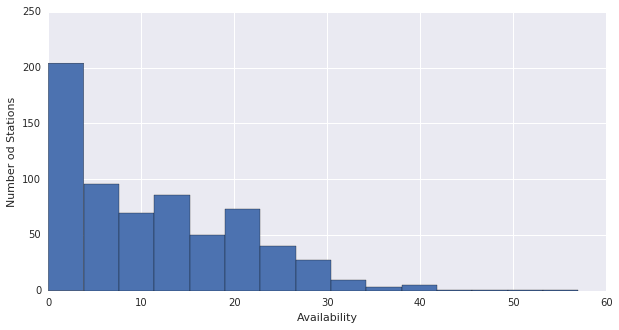

In [12]:
%matplotlib inline
import time
import pylab as plt
from IPython import display

#Set Display size for output
plt.rcParams["figure.figsize"] = [10, 5]

df_station_status = None
timeout = time.time() + 20 # 20 seconds from now
    
#Consume data from IBM Message Hub
for msg in consumer:                 
    if msg.topic == 'citibike':  
        if df_station_status is None:
            df_station_status = pd.DataFrame(_getJSONfromKafka(msg))
            df_station_status = df_station_status.set_index('station_id')  
        else:
            #Update data
            df_temp = pd.DataFrame(_getJSONfromKafka(msg))
            df_temp = df_temp.set_index('station_id')  
            df_station_status.update(df_temp, join = 'left', overwrite=True)            
            
        #Settings histogram
        plt.clf()
        plt.hist(df_station_status['num_bikes_available'], bins=15)
        plt.xlabel('Availability')
        plt.ylabel('Number od Stations')
        
        #Display histogram
        display.display(plt.gcf())
        display.clear_output(wait=True)
        
        #Exit condition after 20 seconds
        if time.time() > timeout: 
            break

### Data Plots - Utilisation and Relations
With the following figures, you can get an deeper insight of the bike sharing data. The figures showing an overview about the utilization for each district as well further statistical information about the stations in boxplots and different kind of scatterplots.

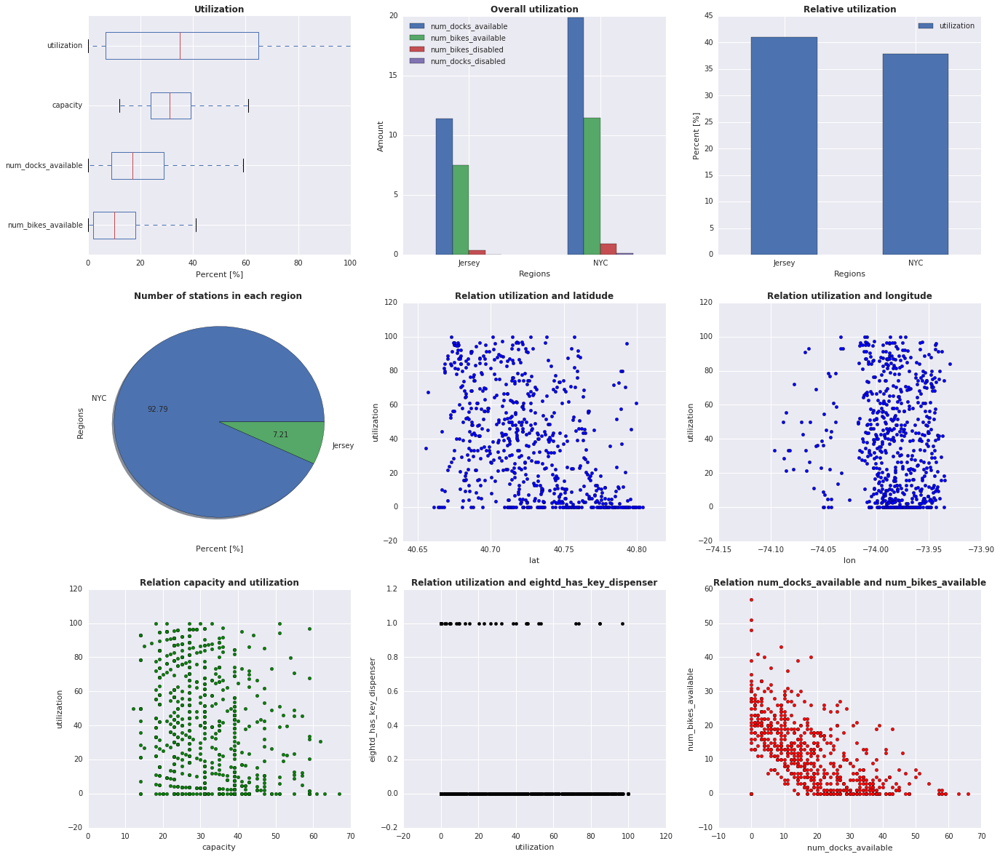

In [13]:
%matplotlib inline
import matplotlib.pyplot as plt

#Set Display size for output
plt.rcParams["figure.figsize"] = [22, 20]

#Set Subplot settings (3x3)
fig, axes = plt.subplots(nrows=3, ncols=3)

#Consume data from IBM Message Hub
for msg in consumer:                 
    if msg.topic == 'citibike':  
        df_station_status = pd.DataFrame(_getJSONfromKafka(msg))
        df_station_status = df_station_status.set_index('station_id')       
        
        #Merge data
        df = pd.merge(df_station_data, df_station_status, how='inner', left_index=True, right_index=True)
        df['utilization'] = (df.num_bikes_available / df.capacity)*100 
        
        #DataFrames grouped by district
        df_overall = df.groupby(['region_id'])[['num_docks_available', 'num_bikes_available', 'num_bikes_disabled', 'num_docks_disabled', 'utilization']].mean()           
            
        #Boxplots
        ax1 = df[['num_bikes_available', 'num_docks_available', 'capacity', 'utilization']].plot.box(vert=False, sym='r+', ax=axes[0,0])
        ax1.set_title('Utilization', fontweight='bold')
        ax1.set_xlabel('Percent [%]')
        
        #BarPlot - Overall utilization  
        ax2 = df_overall[['num_docks_available', 'num_bikes_available', 'num_bikes_disabled', 'num_docks_disabled']].plot.bar(legend=True, stacked=False, ax=axes[0,1]) 
        ax2.set_title('Overall utilization', fontweight='bold')
        ax2.set_xticklabels(['Jersey', 'NYC'], rotation=0)
        ax2.set_xlabel('Regions')
        ax2.set_ylabel('Amount')
    
        #BarPlot - Realtive utilization
        ax3 = df_overall['utilization'].plot.bar(legend=True, ax=axes[0,2]) 
        ax3.set_title('Relative utilization', fontweight='bold') 
        ax3.set_xticklabels(['Jersey', 'NYC'], rotation=0)
        ax3.set_xlabel('Regions')
        ax3.set_ylabel('Percent [%]')
            
        #Pie Chart - Number of Stations       
        values = [3, 12] 
        ax9 = df.region_id.value_counts().plot(kind='pie', autopct='%.2f', ax=axes[1,0], labels=['NYC', 'Jersey'], shadow=True)
        ax9.set_title('Number of stations in each region ', fontweight='bold')
        ax9.set_xlabel('Percent [%]')
        ax9.set_ylabel('Regions')     
               
        #Scatter Plot - Latitiude
        ax5 = df.plot.scatter('lat', 'utilization', c='blue', ax=axes[1,1])
        ax5.set_title('Relation utilization and latidude', fontweight='bold')
        
        #Scatter Plot - Longitude
        ax6 = df.plot.scatter('lon', 'utilization', c='blue', ax=axes[1,2])
        ax6.set_title('Relation utilization and longitude', fontweight='bold')
        
        #Scatter Plot - Capacity
        ax4 = df.plot.scatter('capacity', 'utilization', c='green', ax=axes[2,0])
        ax4.set_title('Relation capacity and utilization', fontweight='bold') 
        
        #Scatter Plot - Key dispender
        ax7 = df.plot.scatter('utilization', 'eightd_has_key_dispenser', c='black', ax=axes[2,1])
        ax7.set_title('Relation utilization and eightd_has_key_dispenser', fontweight='bold')
                
        #Scatter Plot - Docks and Bikes
        ax8 = df.plot.scatter('num_docks_available', 'num_bikes_available', c='red', ax=axes[2,2])       
        ax8.set_title('Relation num_docks_available and num_bikes_available', fontweight='bold')
        
        break

### Correlations
In the following table, you can see the correlation beetween all attributes of the bike sharing data. A correlation coefficient of 1 or -1 mean a high correlation beetween the attributes. A correlation coefficient around 0 stand for a low correlation. 

In [14]:
%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns
            
#Consume data from IBM Message Hub
for msg in consumer:                 
    if msg.topic == 'citibike':  
        df_station_status = pd.DataFrame(_getJSONfromKafka(msg))
        df_station_status = df_station_status.set_index('station_id')       
        
        #Merge data
        df = pd.merge(df_station_data, df_station_status, how='inner', left_index=True, right_index=True)
        df['utilization'] = (df.num_bikes_available / df.capacity)*100 
        df_corr = df.corr()                
        
        #Display table
        df_corr = df_corr.style.background_gradient(cmap=plt.get_cmap('coolwarm'), axis=1)       
        break
df_corr        

<a id="visualize"></a>
# 5 Visualization of real-time system data
In this section, you will learn how to visualize heat maps of real-time system data. You will using the python library __`mplleaflet`__ to create geo maps with [OpenStreetMap](https://www.openstreetmap.org/about). Through the maps, you get a better insight of the capacity, availibilty and utilization of the bike station depending on the station location. 

## Load GeoJson Districts
Download the different districts of New York and Jersey as geojson maps. You will embedded the geojson files in the following mplleaflet maps. 

In [15]:
import geojson
from descartes import PolygonPatch
import matplotlib.pyplot as plt
import numpy as np

#GeoMaps for district in NYC and Jersey
!wget -q 'https://data.cityofnewyork.us/api/geospatial/tqmj-j8zm?method=export&format=GeoJSON' -O district_nyc.geojson
!wget -q 'http://catalog.civicdashboards.com/dataset/9c9c69f3-42f3-4f1e-bdb3-d68bba2ebfd2/resource/657066c7-051e-4606-802f-0ca92d5a18bc/download/aeda17dbe956493a826a2c8b025d67a0njcountypolygonv2.geojson' -O district_jersey.geojson

#Read GeoJson files
with open('district_nyc.geojson') as json_file:
    geojson_nyc = geojson.load(json_file)
    
with open('district_jersey.geojson') as json_file:
    geojson_jersey = geojson.load(json_file)
    
#Define district information and colors
district_nyc = geojson_nyc['features']
district_jersey = geojson_jersey['features']
BLUE = '#6699cc'
GREEN = '#7FFF7F'
RED = '#EC3B00'
YELLOW = '#FFF400'
BLACK = '#000000'
CYAN = '#00FFDF'
ORANGE = '#FFA500'

## GeoMap -  Capacity
The following map shows the capacity for each bike station. Station with a high capacity over 40 are green. Station with a capacity between 20 and 40 are yellow. All stations with a low capcity under 20 bikes are red. In the map you can recoginze, bike stations with a low capacity are mostly in Jersey City or on the outskirts of New York City. On the contrary the stations with a high capcity are predominated in the district Manhatten.   

In [16]:
%matplotlib inline
import mplleaflet
import matplotlib.pyplot as plt
from descartes import PolygonPatch

#Set display size for output
plt.rcParams["figure.figsize"] = [15, 8]
     
#Define stations according to the capacity
df_low = df_station_info[df_station_info['capacity'] <= 20] #Stations with low capacity
df_middle = df_station_info[df_station_info['capacity'].between(20, 40, inclusive=False)] #Stations with middle capacity 
df_high = df_station_info[df_station_info['capacity'] >= 40] #Stations with high capacity          

#Plot capacity stations
f, ax = plt.subplots()                            
plt.plot(df_low['lon'], df_low['lat'], 'rs', label='Line 3')  # Red squares for stations with low capacity
plt.plot(df_middle['lon'], df_middle['lat'], 'ys', label='Line 2') # Yellow squares for stations with middle capacity
plt.plot(df_high['lon'], df_high['lat'], 'gs', label='Line 1') # Green squares for stations with high capacity

#Plot districts
queens = ax.add_patch(PolygonPatch(district_nyc[0]['geometry'], fc=CYAN, ec=BLACK, alpha=0.5, zorder=2))
#statenIsland = ax.add_patch(PolygonPatch(district_nyc[1]['geometry'], fc=ORANGE, ec=BLACK, alpha=1, zorder=2))
#bronx = ax.add_patch(PolygonPatch(district_nyc[2]['geometry'], fc=BLUE, ec=BLACK, alpha=1, zorder=2))
brooklyn = ax.add_patch(PolygonPatch(district_nyc[3]['geometry'], fc=YELLOW, ec=BLACK, alpha=1, zorder=2))
manhatten = ax.add_patch(PolygonPatch(district_nyc[4]['geometry'], fc=RED, ec=BLACK, alpha=1, zorder=2))
jersey = ax.add_patch(PolygonPatch(district_jersey[1]['geometry'], fc=GREEN, ec=BLACK, alpha=1, zorder=2))

#Show map
mplleaflet.display(fig=f)

## Heat Map - Available Bikes
The following heat map shows the availibilty of bikes for each bike station.

In [17]:
%matplotlib inline
import mplleaflet
import matplotlib.pyplot as plt
import matplotlib.cm as cm

#Set display size for output
plt.rcParams["figure.figsize"] = [15, 8]

#Consume data from IBM Message Hub
for msg in consumer:              
    if msg.topic == 'citibike':      
        df_station_status = pd.DataFrame(_getJSONfromKafka(msg))
        df_station_status = df_station_status.set_index('station_id')
        
        #Merge data
        df = pd.merge(df_station_data, df_station_status, how='inner', left_index=True, right_index=True)
                                               
        #Plot availibilty stations                                    
        f, ax = plt.subplots()
        plt.scatter(x=df['lon'], y=df['lat'], c=df['num_bikes_available'], s=100+(100/(df['num_bikes_available']+1)), cmap=cm.get_cmap('hsv'), edgecolor='None')           
        
        #Plot districts
        queens = ax.add_patch(PolygonPatch(district_nyc[0]['geometry'], fc=CYAN, ec=BLACK, alpha=0.5, zorder=2))
        #statenIsland = ax.add_patch(PolygonPatch(district_nyc[1]['geometry'], fc=ORANGE, ec=BLACK, alpha=1, zorder=2))
        #bronx = ax.add_patch(PolygonPatch(district_nyc[2]['geometry'], fc=BLUE, ec=BLACK, alpha=1, zorder=2))
        brooklyn = ax.add_patch(PolygonPatch(district_nyc[3]['geometry'], fc=YELLOW, ec=BLACK, alpha=1, zorder=2))
        manhatten = ax.add_patch(PolygonPatch(district_nyc[4]['geometry'], fc=RED, ec=BLACK, alpha=1, zorder=2))
        jersey = ax.add_patch(PolygonPatch(district_jersey[1]['geometry'], fc=GREEN, ec=BLACK, alpha=1, zorder=2))
               
        break;
mplleaflet.display(fig=f)

## HeatMap - Utilization
The following heat map shows the utilization for each bike station.

In [18]:
%matplotlib inline
import mplleaflet
import matplotlib.pyplot as plt
import matplotlib.cm as cm

#Set display size for output
plt.rcParams["figure.figsize"] = [15, 8]

#Consume data from IBM Message Hub
for msg in consumer:              
    if msg.topic == 'citibike':      
        df_station_status = pd.DataFrame(_getJSONfromKafka(msg))
        df_station_status = df_station_status.set_index('station_id')
        
        #Merge data
        df = pd.merge(df_station_data, df_station_status, how='inner', left_index=True, right_index=True)
        df['utilization'] = (df.num_bikes_available / df.capacity)*100      
        
        #Plot data                                    
        f, ax = plt.subplots()
        plt.scatter(x=df['lon'], y=df['lat'], c=df['utilization'], s=df['utilization']*5, cmap=cm.get_cmap('coolwarm'), edgecolor='None')         
        
        #Plot districts
        queens = ax.add_patch(PolygonPatch(district_nyc[0]['geometry'], fc=CYAN, ec=BLACK, alpha=0.5, zorder=2))
        #statenIsland = ax.add_patch(PolygonPatch(district_nyc[1]['geometry'], fc=ORANGE, ec=BLACK, alpha=1, zorder=2))
        #bronx = ax.add_patch(PolygonPatch(district_nyc[2]['geometry'], fc=BLUE, ec=BLACK, alpha=1, zorder=2))
        brooklyn = ax.add_patch(PolygonPatch(district_nyc[3]['geometry'], fc=YELLOW, ec=BLACK, alpha=1, zorder=2))
        manhatten = ax.add_patch(PolygonPatch(district_nyc[4]['geometry'], fc=RED, ec=BLACK, alpha=1, zorder=2))
        jersey = ax.add_patch(PolygonPatch(district_jersey[1]['geometry'], fc=GREEN, ec=BLACK, alpha=1, zorder=2))
        
        break;
mplleaflet.display(fig=f)       

<a id="summary"></a>
# 6 Summary and next steps
You successfully completed this notebook! You learned how to use IBM Message Hub, Pandas, PixieDust as well as Mplleaflet for consuming, analysing and visualizing real-time system data. Check out our [Data Science Experience Community](https://apsportal.ibm.com/community?context=analytics) for more samples, tutorials, notebooks, how-tos, and blog posts.

### Next Steps
Using historical bike sharing data and weather data for deeper insights.

